## Example 2: Creating Dataset

This example shows how the __Data__ class of the _eso_ package is used to generate datasets from audio files for the baseline and the ESO CNN classifier.

In [23]:
from eso.model.data import Data
from eso.utils import settings

import librosa

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

A dictionary or a json file can be used to set the parameters that are used as input. The __settings__ dict is an example of such a file.

In [2]:
species_folder = '/home/aaron-joel/Documents/Examples/SmallData/'

settings_dict = {
    "algorithm": {"max_generations": 2},
    "genetic_operator": {
        "mutation_rate": 0.1,
        "crossover_rate": 0.8,
        "reproduction_rate": 0.1,
        "mutation_height_range": 0,
        "mutation_position_range": 10,

    },
    "selection_operator": {"tournament_size": 10},
    "data": {
        "force_recreate_dataset": False,
        "keep_in_memory": False,
        "species_folder" : species_folder,
        "train_size": 0.8,
        "test_size": 0.2,
        "reshuffle": False,
        "positive_class": "gibbon",
        "negative_class": "no-gibbon",
    },
    "preprocessing": {
        "lowpass_cutoff": 2000,
        "downsample_rate": 4800,
        "nyquist_rate": 2400,
        "segment_duration": 4,
        "nb_negative_class": 20,
        "file_type": "svl",
        "audio_extension": ".wav",
        "n_fft": 1024,
        "hop_length": 256,
        "n_mels": 128,
        "f_min": 4000,
        "f_max": 9000,
    },
    "population": {"pop_size": 20},
    "gene": {
        "min_position": 0, 
        "max_position": -1, 
        "min_height": 6, 
        "max_height": 10
    },
    "chromosome": {
        "num_genes": 4,
        "min_num_genes": 4,
        "max_num_genes": 6,
        "lambda_1": 0.6,
        "lambda_2": 0.4,
    },
    "model": {
        "optimizer_name": "adam",
        "loss_function_name": "cross_entropy",
        "num_epochs": 1,
        "batch_size": 8,
        "learning_rate": 0.001,
        "shuffle": True,
        "metric": "f1",
    },
}

In [3]:
data = Data(apply_preprocessing=False, 
            preprocessing_args=settings_dict['preprocessing'],
            **settings_dict['data'])

The method _create_datasets_ is called to create the dataset. The parameter '*apply_preprocessing*' is set to False in order to generate the dataset used for ESO classifier. For the baseline CNN, this parameter is set to True.

In [4]:
# The dataset is only created if it does not already exist. 
# We can however decided to re-create it each time
data.create_datasets()

Found already existing shuffled file names! Loading from memory..
The dataset already exists. Skipping...
Loading dataset to set image shape...
Dataset loaded from /home/aaron-joel/Documents/Examples/SmallData/SavedData/unpreprocessed/train
The dataset already exists. Skipping...
The dataset already exists. Skipping...


To ensure that the data is re-created, we set '*force_recreate_dataset=True*' in settings_dict['data']

In [5]:
settings_dict['data']['force_recreate_dataset'] = True

In [6]:
data = Data(apply_preprocessing=False, 
            preprocessing_args=settings_dict['preprocessing'],
            **settings_dict['data'])

In [7]:
data.create_datasets()

Found already existing shuffled file names! Loading from memory..
File path: /home/aaron-joel/Documents/Examples/SmallData/DataFiles/train.txt
Creating the training dataset


Found file HGSM3AB_0+1_20160316_055100
Found file HGSM3AB_0+1_20160317_055000
Found file HGSM3AB_0+1_20160330_053900
2268
(array(['gibbon', 'no-gibbon'], dtype='<U9'), array([ 542, 1726]))
Augmentation 
2268 2268


Dataset created and saved at /home/aaron-joel/Documents/Examples/SmallData/SavedData/unpreprocessed/train/X.pkl
File path: /home/aaron-joel/Documents/Examples/SmallData/DataFiles/validation.txt
Creating the validation dataset


Found file HGSM3AB_0+1_20160310_055600
338
(array(['gibbon', 'no-gibbon'], dtype='<U9'), array([218, 120]))


Dataset created and saved at /home/aaron-joel/Documents/Examples/SmallData/SavedData/unpreprocessed/validation/X.pkl
File path: /home/aaron-joel/Documents/Examples/SmallData/DataFiles/test.txt
Creating the validation dataset


Found file HGSM3AB_0+1_20160305_055900
867
(array(['gibbon', 'no-gibbon'], dtype='<U9'), array([178, 689]))


Dataset created and saved at /home/aaron-joel/Documents/Examples/SmallData/SavedData/unpreprocessed/test/X.pkl


The '*get_data*' method of the __Data__ class returned the array of data (X) spectrograms and the labels (Y)

In [10]:
X, Y = data.get_data()
print(f'The shape of X is: {X.shape}')
print(f'The shape of Y is: {Y.shape}')

Loading dataset...
Dataset loaded from /home/aaron-joel/Documents/Examples/SmallData/SavedData/unpreprocessed/train


The shape of X is: (3452, 128, 151)
The shape of Y is: (3452, 2)


In [11]:
Y[:10]

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.]])

In [12]:
Y[-10:]

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [14]:
# Extract data corresponding to gibbons calls
X_calls = X[np.where(Y[:, 1] == 1)[0]]
X_nocalls = X[np.where(Y[:,1] == 0)[0]]

print(f'Shape of X_calls: {X_calls.shape}')
print(f'Shape of X_nocalls: {X_nocalls.shape}')

Shape of X_calls: (1726, 128, 151)
Shape of X_nocalls: (1726, 128, 151)


In [18]:
# Generate some random indices
indices = np.random.randint(low=0, high=X_calls.shape[0]-1, size=100)
indices

array([ 140, 1275, 1555,  684,  755,  932, 1680, 1088,  298,  464, 1652,
        811,  434,  200, 1641, 1566,  746,  546, 1663, 1224, 1076,  300,
         63,  961, 1205,  557, 1080, 1563, 1346,  862,  753, 1361,  465,
        260,  848, 1060, 1349,  767,  937,  358,  161,  644,  854,  730,
        541, 1670, 1305,  948,  419,  260, 1577,  883, 1052, 1468,  288,
       1294,  484, 1421,   17,  595, 1510,  912,  238, 1287,    3,  242,
        645,  118,  875,  417,  292,  723, 1121,  750,   96,  707, 1427,
        978,  463,  911,   66, 1241, 1137, 1581, 1440, 1152, 1282, 1176,
        845, 1615,  651,  984,  788, 1610,  903,  584,  812, 1281,  666,
        918])

In [27]:
X_indices = X_calls[indices]
X_indices.shape

(100, 128, 151)

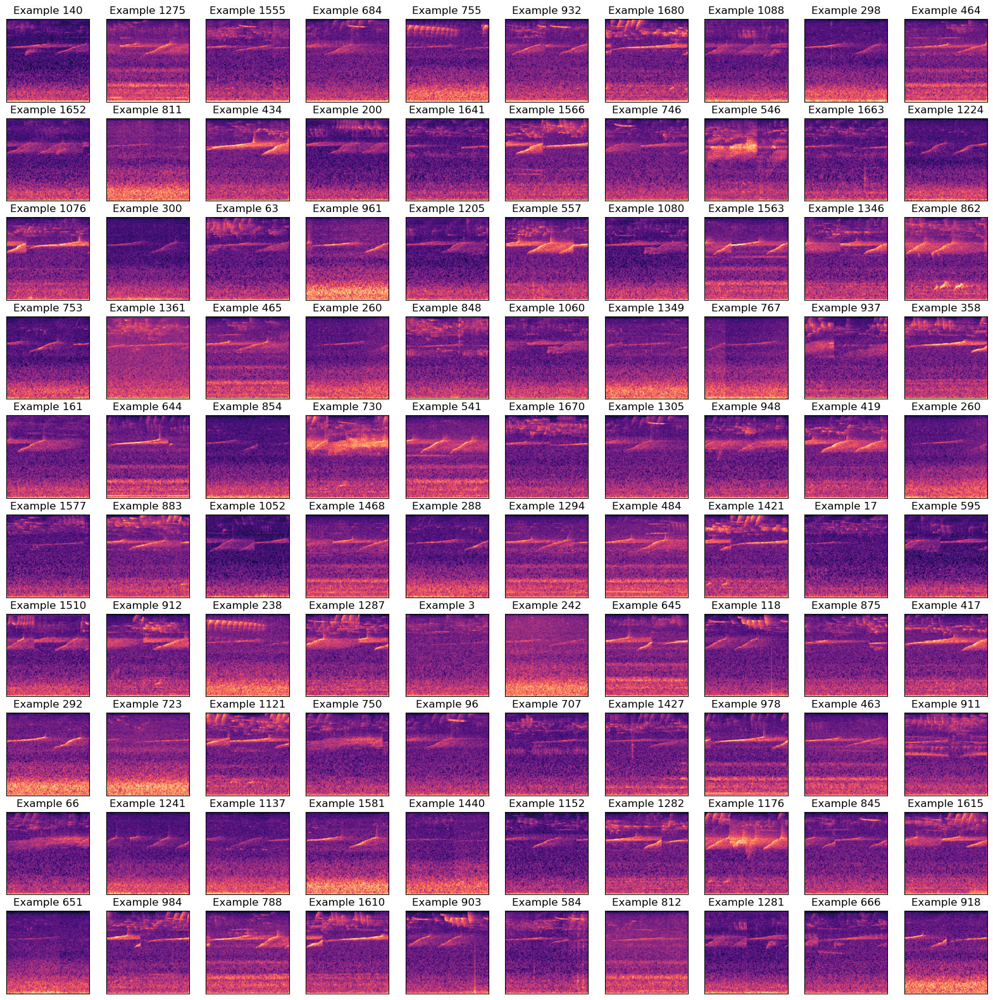

In [28]:
# Let's plot some spectrograms corresponding to gibbon calls
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
for i, ax in enumerate(axes.flat):
    librosa.display.specshow(X_indices[i], ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Example {indices[i]}')
plt.show()

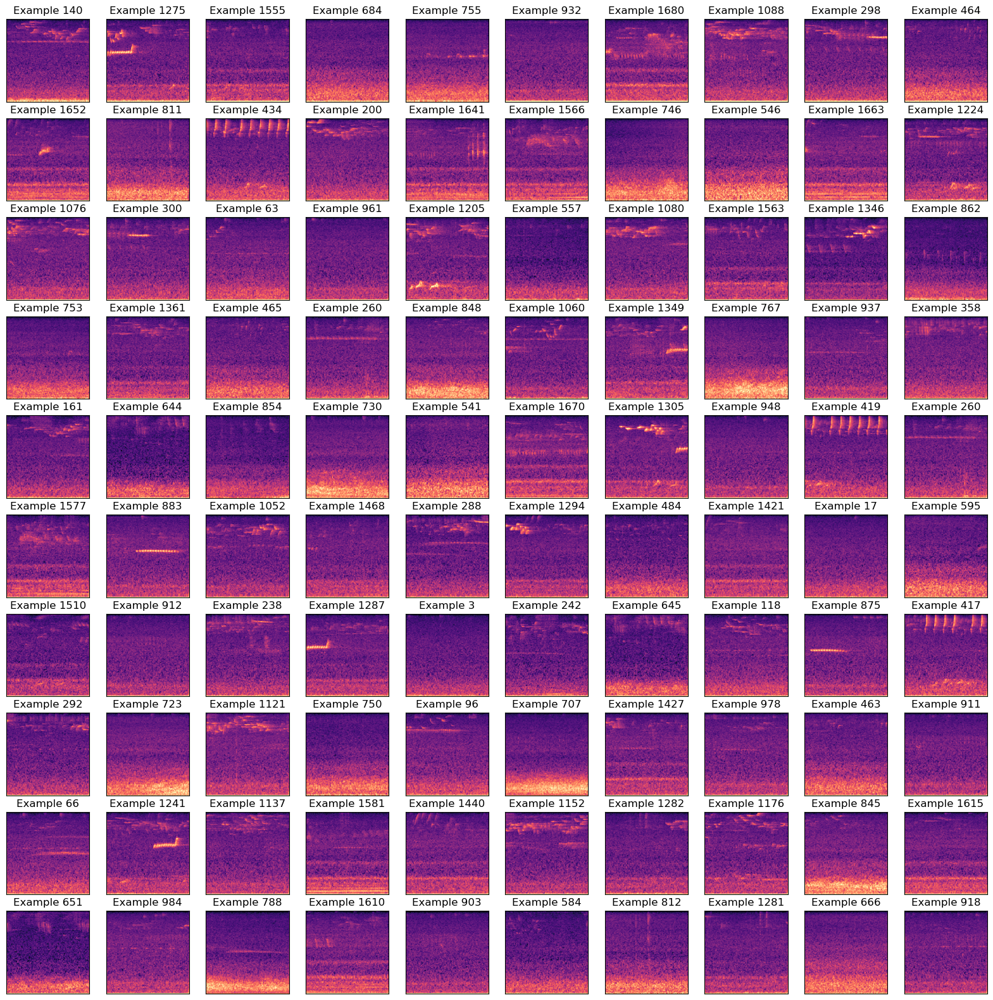

In [29]:
# Let's plot some spectrograms corresponding to non-gibbon calls
X_indices = X_nocalls[indices]
fig, axes = plt.subplots(10, 10, figsize=(20, 20))
for i, ax in enumerate(axes.flat):
    librosa.display.specshow(X_indices[i], ax=ax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Example {indices[i]}')
plt.show()